In [1]:
import tensorflow as tf

In [2]:
import warnings; warnings.simplefilter('ignore')

In [3]:
import os
import sys
import math
import random
import numpy as np
import cv2
#import Mask
import skimage.io
from IPython.display import Image
from PIL import Image
from imgaug import augmenters as iaa
import matplotlib.pyplot as plt




# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
from mrcnn.visualize import display_images


%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Using TensorFlow backend.


In [4]:
class CellsConfig(Config):
    NAME = "cells"
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    
    NUM_CLASSES = 1+1 # background + cell
    
    # size of images are 256px X 256px
    IMAGE_MIN_DIM = 256
    IMAGE_MAX_DIM = 256 
    
     # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels
    #TRAIN_ROIS_PER_IMAGE = 512
    TRAIN_ROIS_PER_IMAGE = 200
    STEPS_PER_EPOCH = 100
    VALIDATION_STEPS = 50
    
    LEARNING_RATE = 1e-4 

config = CellsConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_MAX_DIM                  256
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  256
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.0001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCE

In [5]:
class CellsDataset(utils.Dataset):
    """Generates a cells dataset for training. Dataset consists of microscope images
    of one cell and a background. They each have a 256x256 resolution"""
        
    def load_cells(self, dataset_dir, subset):
        """Loads cell images from the dataset directory"""
        
        # Add class
        self.add_class("cells", 1, "cellobj")
 
        assert subset in ["train", "test", "fov"]
        if subset=="train":
            dataset_dir = os.path.join(dataset_dir, "training_data")
        elif subset=="test":
            dataset_dir = os.path.join(dataset_dir, "testing_data")
        elif subset=="fov":
            pass
        count = 0
        for image_dir in next(os.walk(dataset_dir))[1]:
            path = os.path.join(dataset_dir, os.path.join(image_dir, 'image/image.tif'))
            self.add_image('cells', count, path)
            count +=1
    
    def load_image(self, image_id):
        """Load the specified image and return a [H,W,3] Numpy array.
        """
        # Load image
        image = skimage.io.imread(self.image_info[image_id]['path'])
        # If 16bit, convert to 8bit
        if image.dtype=='uint16': 
            image = self.map_uint16_to_uint8(image, lower_bound=None, upper_bound=None)
        # If grayscale. Convert to RGB for consistency.
        if image.ndim != 3:
            image = skimage.color.gray2rgb(image)
        # If has an alpha channel, remove it for consistency
        if image.shape[-1] == 4:
            image = image[..., :3]
        return image
    
    
    def load_mask(self, image_id):
        info = self.image_info[image_id]
        
        # Get mask directory from image path
        mask_dir = os.path.join(os.path.dirname(os.path.dirname(info['path'])), "masks")
        print(mask_dir)
        # Read mask files from .jpg image
        mask = []
        for f in next(os.walk(mask_dir))[2]:
            if f.endswith('.tif'):
                m = skimage.io.imread(os.path.join(mask_dir, f)).astype(np.bool)
                mask.append(m)
        mask = np.stack(mask, axis=-1)
        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID, we return an array of ones
        return mask, np.ones([mask.shape[-1]], dtype=np.int32) 
    
    def map_uint16_to_uint8(self, img, lower_bound=None, upper_bound=None):
        '''
        Map a 16-bit image trough a lookup table to convert it to 8-bit.

        Parameters
        ----------
        img: numpy.ndarray[np.uint16]
            image that should be mapped
        lower_bound: int, optional
            lower bound of the range that should be mapped to ``[0, 255]``,
            value must be in the range ``[0, 65535]`` and smaller than `upper_bound`
            (defaults to ``numpy.min(img)``)
        upper_bound: int, optional
           upper bound of the range that should be mapped to ``[0, 255]``,
           value must be in the range ``[0, 65535]`` and larger than `lower_bound`
           (defaults to ``numpy.max(img)``)

        Returns
        -------
        numpy.ndarray[uint8]
        '''
        
        if lower_bound is None:
            lower_bound = np.min(img)
        if not(0 <= lower_bound < 2**16):
            raise ValueError(
                '"lower_bound" must be in the range [0, 65535]')
        if upper_bound is None:
            upper_bound = np.max(img)
        if not(0 <= upper_bound < 2**16):
            raise ValueError(
                '"upper_bound" must be in the range [0, 65535]')    
        if lower_bound >= upper_bound:
            raise ValueError(
                '"lower_bound" must be smaller than "upper_bound"')
        lut = np.concatenate([
            np.zeros(lower_bound, dtype=np.uint16),
            np.linspace(0, 255, upper_bound - lower_bound).astype(np.uint16),
            np.ones(2**16 - upper_bound, dtype=np.uint16) * 255
        ])
        return lut[img].astype(np.uint8)
        
    def pad(self, num):
        return '{0:04d}'.format(num)
    
    def size(self):
        return len(self._image_ids)

    

In [6]:
dataset_dir = os.path.join(ROOT_DIR, '/data/kimjb/Mask_RCNN/images/images')


dataset_train = CellsDataset()
dataset_train.load_cells(dataset_dir, subset="train")
dataset_train.prepare()

dataset_test = CellsDataset()
dataset_test.load_cells(dataset_dir, subset="test")
dataset_test.prepare()



### Image visualization

In [ ]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    print(image.shape)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

In [ ]:
# Load random image and mask.
image_id = random.choice(dataset_train.image_ids)
image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset_train.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

In [ ]:
#image_id = np.random.choice(dataset.image_ids, 1)[0]
#image_id = random.choice(dataset_train.image_ids)
info = dataset_train.image_info[image_id]
print(info['path'])
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset_train, config, image_id, use_mini_mask=False)

visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)
log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(mask.shape[-1])])

In [ ]:
augmentation = iaa.Sometimes(0.9, [
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Multiply((0.8, 1.2)),
    iaa.GaussianBlur(sigma=(0.0, 5.0))
])

In [ ]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset_train, config, image_id, augmentation=augmentation, use_mini_mask=True)
print(mask.shape)
display_images([image]+[mask[:,:,i] for i in range(mask.shape[-1])])

In [ ]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

### Inference (testing with and without GT)

In [7]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

In [8]:
class InferenceConfig(CellsConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # below, comment if running inference on small crops
    TRAIN_ROIS_PER_IMAGE = 2000
    POST_NMS_ROIS_INFERENCE = 13000
    DETECTION_MAX_INSTANCES = 200
    #DETECTION_NMS_THRESHOLD = 0.35
    IMAGE_MIN_DIM = 1280
    IMAGE_MAX_DIM = 1280 

inference_config = InferenceConfig()

# Recreate the model in inference mode
DEVICE = '/device:GPU:0'
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")

#model_path = model.find_last()[1]
model_path = '/data/kimjb/Mask_RCNN/logs/cells20180719T1559/mask_rcnn_cells.h5'

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /data/kimjb/Mask_RCNN/logs/cells20180719T1559/mask_rcnn_cells.h5


Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


NameError: name 'fov_dataset' is not defined

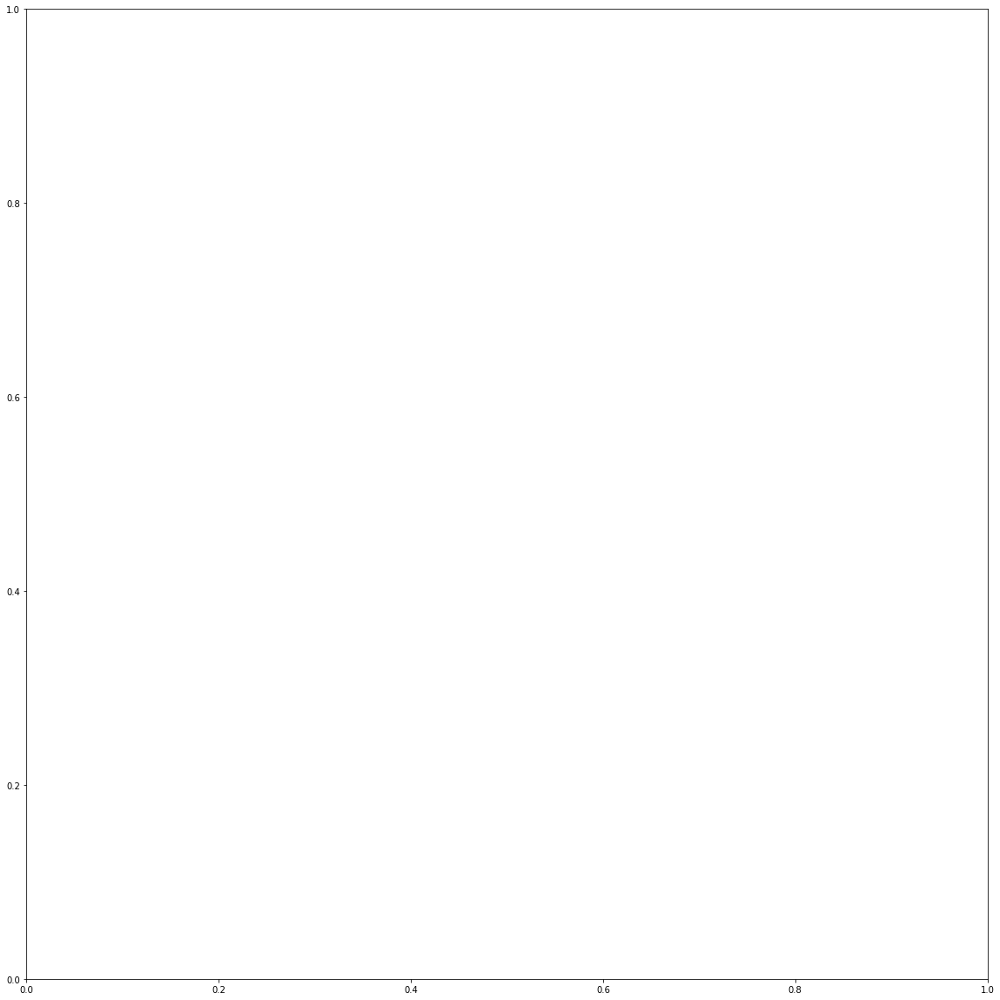

In [14]:
# Run object detection
image_id = random.choice(dataset_test.image_ids)
image = dataset_test.load_image(image_id)
#image_id = random.choice(dataset_test.image_ids)
#image = dataset_test.load_image(image_id)
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            fov_dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")

In [ ]:
# prints the mAP for the specific model

def get_ap_for_model(model_path):
    
    model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)
    
    assert model_path != "", "Provide path to trained weights"
    model.load_weights(model_path, by_name=True)
    
    # image_ids = np.random.choice(fov_dataset.image_ids, 7)
    image_ids = fov_dataset.image_ids
    APs = []
    for image_id in image_ids:
        # Load image and ground truth data
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(fov_dataset, inference_config,
                                   image_id, use_mini_mask=False)
        molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        # Run objebct detection
        results = model.detect([image], verbose=0)
        r = results[0]
        # Compute AP
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                             r["rois"], r["class_ids"], r["scores"], r['masks'])
        APs.append(AP)
    
    meanAP = np.mean(APs)
    
    #print("mAP: {mean} \nmodel: {path} \n".format(mean=np.mean(APs), path=model_path))
    return meanAP

In [ ]:
mAP = get_ap_for_model('/data/kimjb/Mask_RCNN_original/logs/cells20180628T1527/mask_rcnn_cells_0100.h5')
print("mAP: {}\n".format(mAP))

In [ ]:
# go through each model in model_dir
model_dir = '/data/kimjb/Mask_RCNN/logs/cells20180626T1146/'
epoch_ap_dict = {}
epoch_check_list = []

for filename in os.listdir(model_dir):
    if filename.endswith('.h5'): 
        epoch_check_list.append(filename)

epoch_check_list.sort()

# get model for 
for model in epoch_check_list[24::25]:
    model_path = os.path.join(model_dir, model)
    mAP = get_ap_for_model(model_path)
    epoch_ap_dict[filename] = mAP
                
for key in sorted(epoch_ap_dict.keys()):
    print("mAP: {mean} \nmodel: {path} \n".format(mean=epoch_ap_dict[key], path=key))

In [ ]:
for key in sorted(epoch_ap_dict.keys()):
    print("mAP: {mean} \nmodel: {path} \n".format(mean=epoch_ap_dict[key], path=key))

In [ ]:
get_ap_for_model('/data/kimjb/Mask_RCNN/logs/cells20180626T1146/mask_rcnn_cells_0100.h5')

In [ ]:
image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_train, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)


In [ ]:
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_train.class_names)

In [ ]:
SEaug = iaa.Sequential( [
    iaa.Sharpen(alpha=(0.0, 1.0), lightness=(0.75, 2.0)),
    iaa.Emboss(alpha=(0.0, 1.0), strength=(0.5, 1.5))
], random_order=True)

# Gaussian Noise
GNaug = iaa.AdditiveGaussianNoise(scale=(0, 0.05*255))

# Color
Caug = iaa.Sequential([
    iaa.WithChannels(0, iaa.Add((10, 100))),
    iaa.WithChannels(1, iaa.Add((10, 100))),
    iaa.WithChannels(2, iaa.Add((10, 100)))
])

# Brightness and Contrast
BCaug = iaa.Sequential([
    iaa.ContrastNormalization((0.5, 1.5)),
    iaa.Multiply((0.5, 1.5))
], random_order=True)

# Flips
Faug = iaa.Sequential( [
    iaa.Fliplr(.5),
    iaa.Flipud(.5),
])

#blur and brightness - intuition is that some cells are super bright and blurred so this will help identify cells like that
BBaug = iaa.Sequential([
    iaa.GaussianBlur(sigma=(0.0, 3.0)),
    iaa.AverageBlur(k=(2, 5)),
    iaa.MedianBlur(k=(3, 7)),
    iaa.Multiply((.5, 3))
], random_order=True)

#transform 
Taug = iaa.Sequential( [
    iaa.ElasticTransformation(alpha=(0, 5.0), sigma=0.25),
    iaa.Superpixels(p_replace=0.5, n_segments=64),
    iaa.PiecewiseAffine(scale=(0.01, 0.05))
])

augmentation = iaa.Sometimes(.5, [
        SEaug,
        GNaug,
        Caug,
        BBaug,
        BCaug,
        Faug,
        Taug
    ])

In [ ]:
# transformations
Taug = iaa.Sequential( [
    iaa.ElasticTransformation(alpha=(0, 2.0), sigma=0.25),
    iaa.Superpixels(p_replace=0.5, n_segments=64),
    iaa.PiecewiseAffine(scale=(0.01, 0.05))
])
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset_train, config, image_id, augmentation=Taug, use_mini_mask=False)
display_images([image])

In [ ]:
image_id = random.choice(dataset_test.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_train, config, image_id, use_mini_mask=False)
info = dataset_train.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset_train.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

# Run object detection
results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)

# Display results
r = results[0]
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

# Compute AP over range 0.5 to 0.95 and print it
utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                       r['rois'], r['class_ids'], r['scores'], r['masks'],
                       verbose=1)

visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset_train.class_names, ax=get_ax(),
    show_box=False, show_mask=False,
    iou_threshold=0.5, score_threshold=0.5)

In [9]:
dataset_dir = '/data/kimjb/Mask_RCNN/images/fov'

fov_dataset = CellsDataset()
fov_dataset.load_cells(dataset_dir, subset='fov')
fov_dataset.prepare()


In [ ]:
dataset_dir = '/data/kimjb/Mask_RCNN/images/to_caltech/exp3'

fov_dataset = CellsDataset()
fov_dataset.load_cells(dataset_dir, subset='fov')
fov_dataset.prepare()

In [ ]:
# visualize differences for new fov

image_id = random.choice(fov_dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(fov_dataset, config, image_id, use_mini_mask=False)
info = fov_dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       fov_dataset.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

# Run object detection
results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)

# Display results
r = results[0]
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

# Compute AP over range 0.5 to 0.95 and print it
utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                       r['rois'], r['class_ids'], r['scores'], r['masks'],
                       verbose=1)

visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    fov_dataset.class_names, ax=get_ax(),
    show_box=False, show_mask=False,
    iou_threshold=0.5, score_threshold=0.5)

In [ ]:
def map_uint16_to_uint8(img, lower_bound=None, upper_bound=None):
        '''
        Map a 16-bit image trough a lookup table to convert it to 8-bit.

        Parameters
        ----------
        img: numpy.ndarray[np.uint16]
            image that should be mapped
        lower_bound: int, optional
            lower bound of the range that should be mapped to ``[0, 255]``,
            value must be in the range ``[0, 65535]`` and smaller than `upper_bound`
            (defaults to ``numpy.min(img)``)
        upper_bound: int, optional
           upper bound of the range that should be mapped to ``[0, 255]``,
           value must be in the range ``[0, 65535]`` and larger than `lower_bound`
           (defaults to ``numpy.max(img)``)

        Returns
        -------
        numpy.ndarray[uint8]
        '''
        
        if lower_bound is None:
            lower_bound = np.min(img)
        if not(0 <= lower_bound < 2**16):
            raise ValueError(
                '"lower_bound" must be in the range [0, 65535]')
        if upper_bound is None:
            upper_bound = np.max(img)
        if not(0 <= upper_bound < 2**16):
            raise ValueError(
                '"upper_bound" must be in the range [0, 65535]')    
        if lower_bound >= upper_bound:
            raise ValueError(
                '"lower_bound" must be smaller than "upper_bound"')
        lut = np.concatenate([
            np.zeros(lower_bound, dtype=np.uint16),
            np.linspace(0, 255, upper_bound - lower_bound).astype(np.uint16),
            np.ones(2**16 - upper_bound, dtype=np.uint16) * 255
        ])
        return lut[img].astype(np.uint8)

Processing 1 images
image                    shape: (1078, 1278, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  145.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


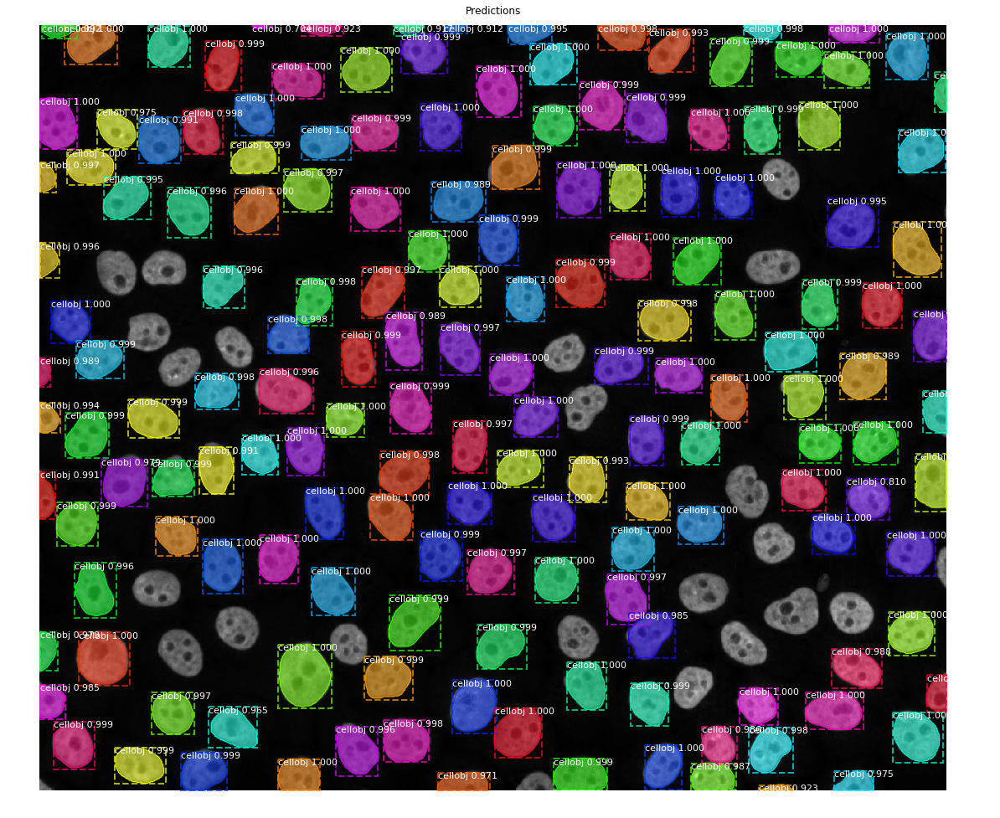

In [10]:
## Run object detection
#image_id = random.choice(fov_dataset.image_ids)
#image = skimage.io.imread('/data/kimjb/Mask_RCNN/image_test/fov/6ee33c7e5e053a95db7c4ad1526746b944d8b961ed66e3dbaca02614/image/image.tif')
#image = map_uint16_to_uint8(image, lower_bound=None, upper_bound=None)
#image = skimage.color.gray2rgb(image)
image_id = random.choice(fov_dataset.image_ids)
image = fov_dataset.load_image(image_id)

results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            fov_dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")

In [11]:
print(r['masks'].shape)
print(r['rois'].shape)
print(r['class_ids'].shape)
print(r['scores'].shape)
print(image.shape)


(1078, 1278, 163)
(163, 4)
(163,)
(163,)
(1078, 1278, 3)


Processing 1 images
image                    shape: (1078, 1278, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  145.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


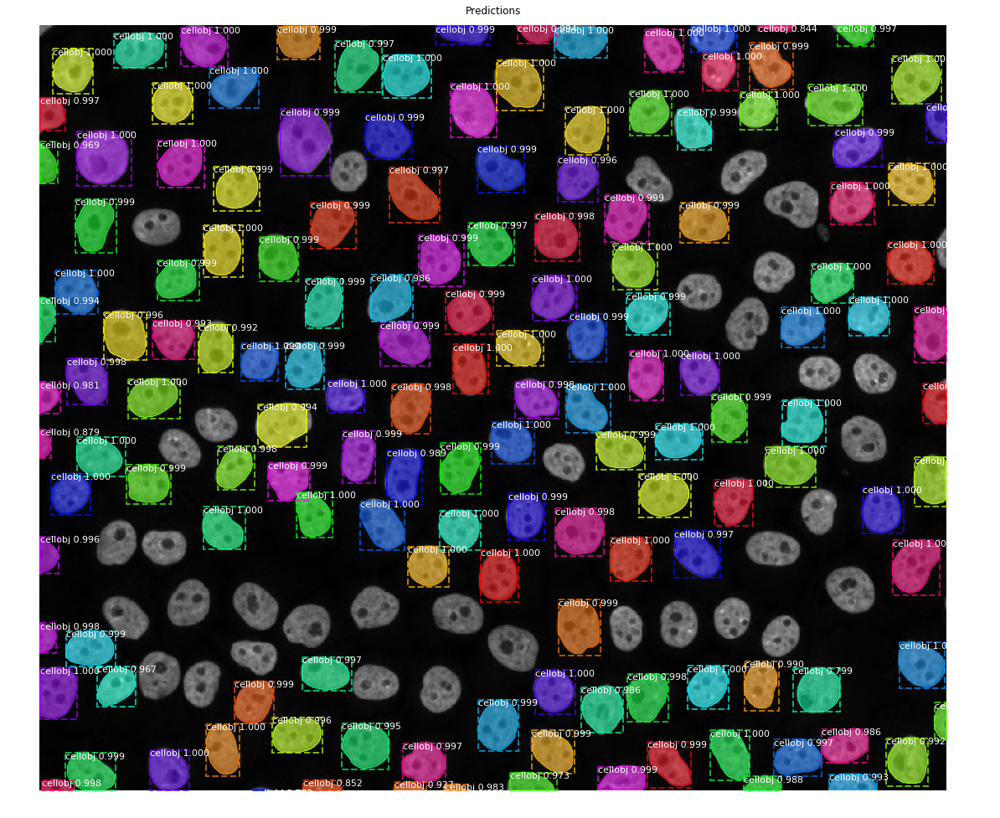

In [12]:
flipud = np.flipud(image)
udresults = model.detect([flipud], verbose=1)
ax = get_ax(1)
udr = udresults[0]
visualize.display_instances(flipud, udr['rois'], udr['masks'], udr['class_ids'], 
                            fov_dataset.class_names, udr['scores'], ax=ax,
                            title="Predictions")

Processing 1 images
image                    shape: (1078, 1278, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  145.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


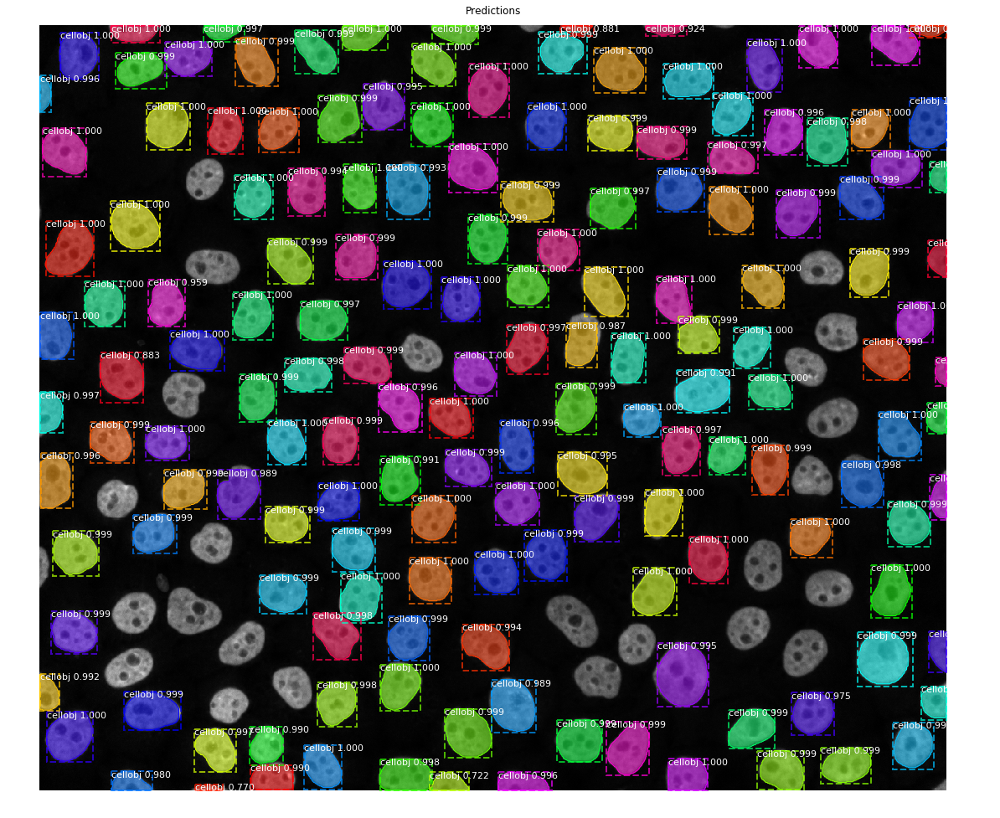

In [13]:
fliplr = np.fliplr(image)
lrresults = model.detect([fliplr], verbose=1)
ax = get_ax(1)
lrr = lrresults[0]
visualize.display_instances(fliplr, lrr['rois'], lrr['masks'], lrr['class_ids'], 
                            fov_dataset.class_names, lrr['scores'], ax=ax,
                            title="Predictions")

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  191.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:   86.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


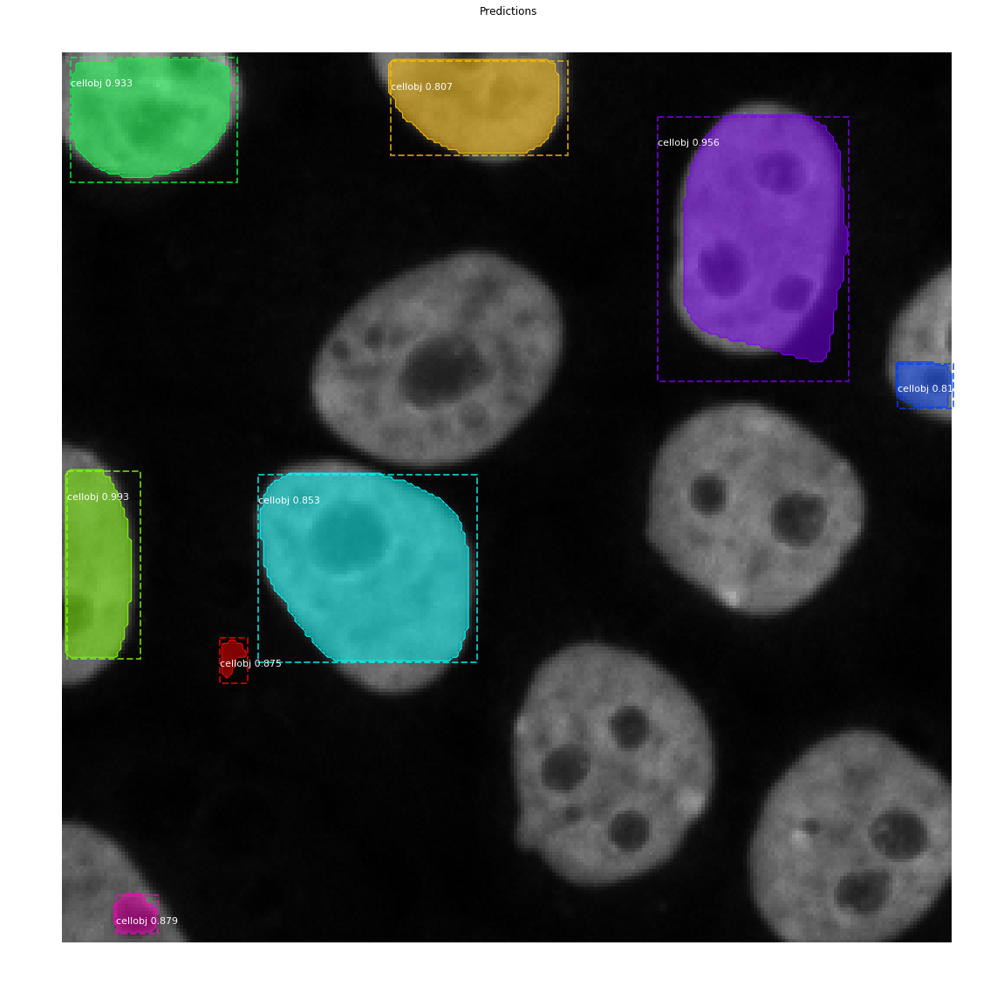

In [14]:
def randomCrop(img, width, height):
    assert img.shape[0] >= height
    assert img.shape[1] >= width
    x = random.randint(0, img.shape[1] - width)
    y = random.randint(0, img.shape[0] - height)
    img = img[y:y+height, x:x+width]
    return img

cimage = randomCrop(fov_dataset.load_image(image_id), 256, 256)
cresults = model.detect([cimage], verbose=1)

# Display results
ax = get_ax(1)
cr = cresults[0]
visualize.display_instances(cimage, cr['rois'], cr['masks'], cr['class_ids'], 
                            fov_dataset.class_names, cr['scores'], ax=ax,
                            title="Predictions")

(1078, 1278, 3)
Processing 1 images
image                    shape: (539, 639, 3)         min:    0.00000  max:  228.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  122.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


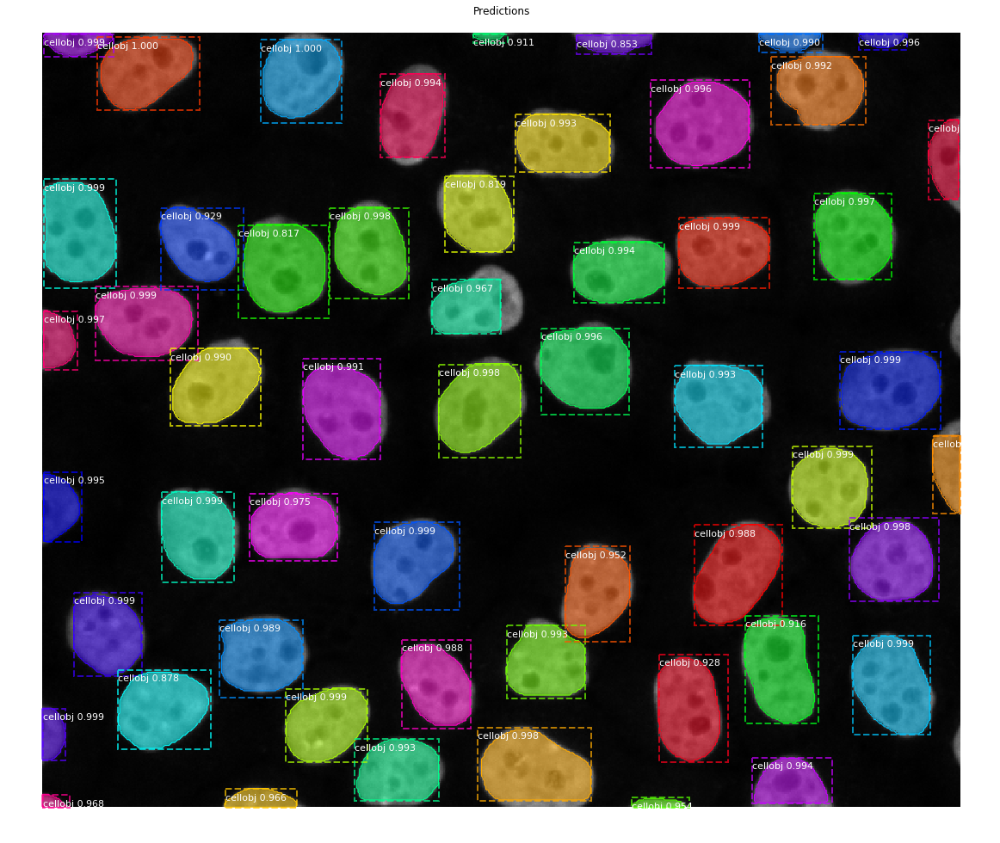

In [15]:
# split into 4 blocks
print(image.shape)
# b1 = image[0:512, 0:512,:]
b1 = image[0:539, 0:639, :]

b1results = model.detect([b1], verbose=1)
ax = get_ax(1)
b1r = b1results[0]
visualize.display_instances(b1, b1r['rois'], b1r['masks'], b1r['class_ids'], 
                            fov_dataset.class_names, b1r['scores'], ax=ax,
                            title="Predictions")

Processing 1 images
image                    shape: (539, 639, 3)         min:    0.00000  max:  218.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  112.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


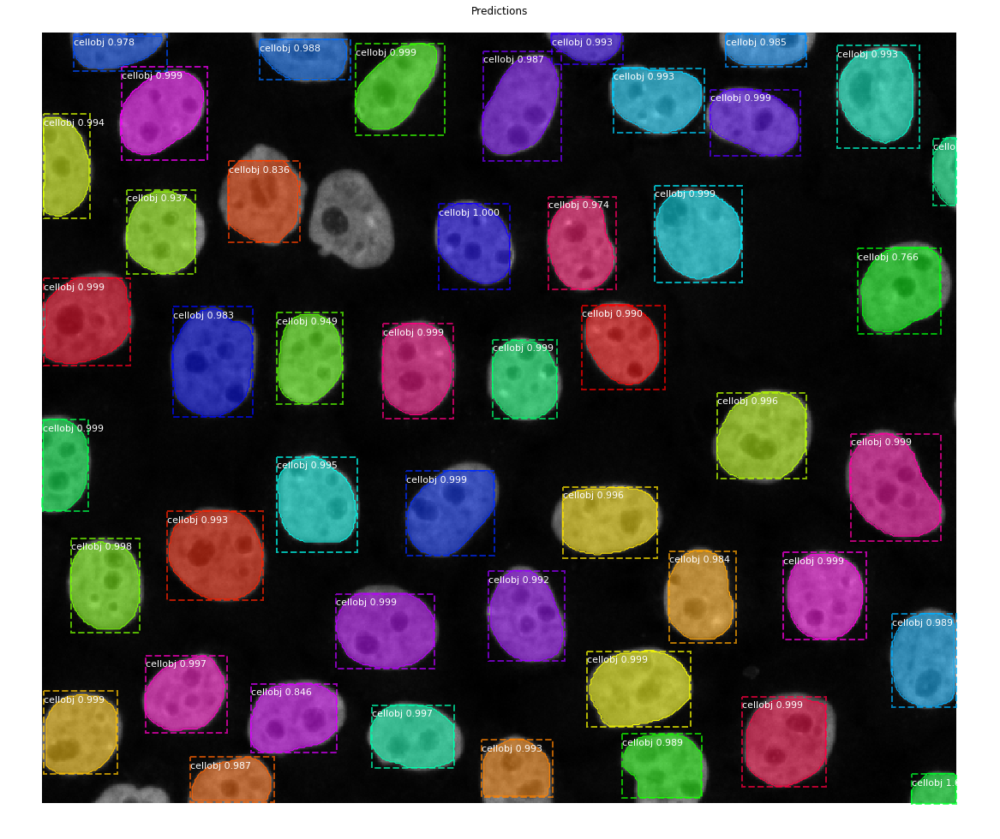

In [16]:
#b2 = image[0:512, 512:,:]
b2 = image[0:539, 639:, :]

b2results = model.detect([b2], verbose=1)
ax = get_ax(1)
b2r = b2results[0]
visualize.display_instances(b2, b2r['rois'], b2r['masks'], b2r['class_ids'], 
                            fov_dataset.class_names, b2r['scores'], ax=ax,
                            title="Predictions")

Processing 1 images
image                    shape: (539, 639, 3)         min:    0.00000  max:  203.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:   98.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


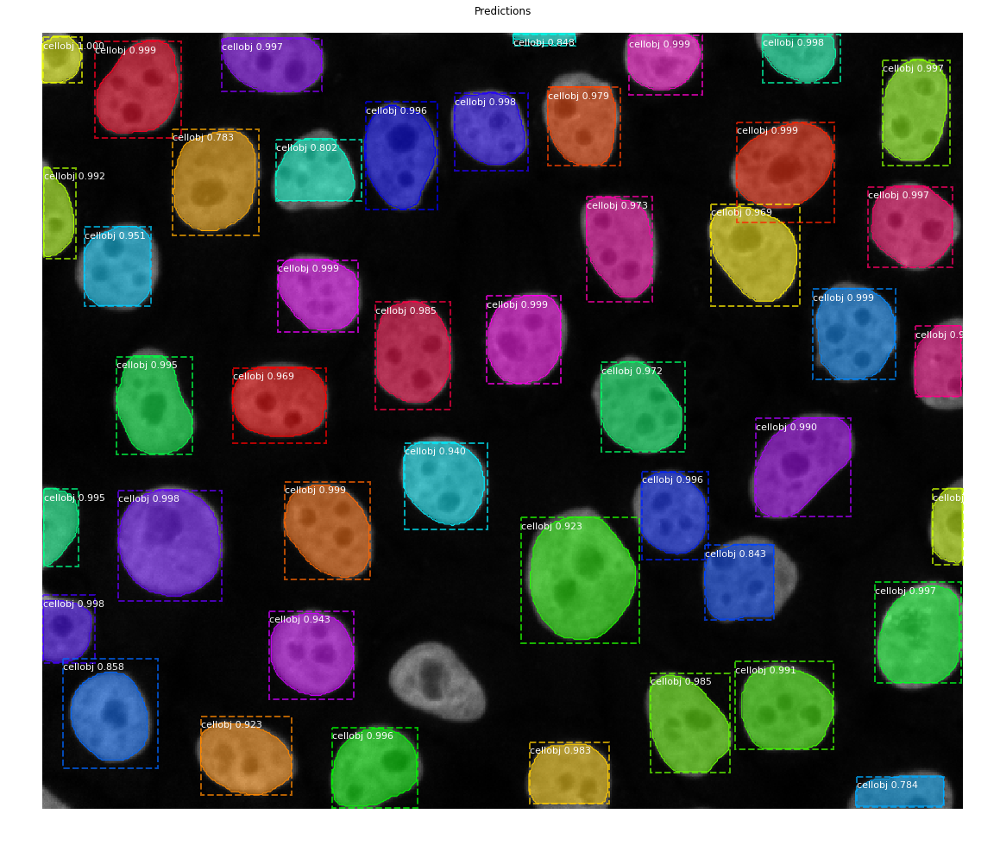

In [17]:
# b3 = image[512:, 0:512,:]
b3 = image[539:, 0:639, :]


b3results = model.detect([b3], verbose=1)
ax = get_ax(1)
b3r = b3results[0]
visualize.display_instances(b3, b3r['rois'], b3r['masks'], b3r['class_ids'], 
                            fov_dataset.class_names, b3r['scores'], ax=ax,
                            title="Predictions")

Processing 1 images
image                    shape: (539, 639, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1280, 1280, 3)    min: -123.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 409200, 4)        min:   -0.07077  max:    1.02073  float32


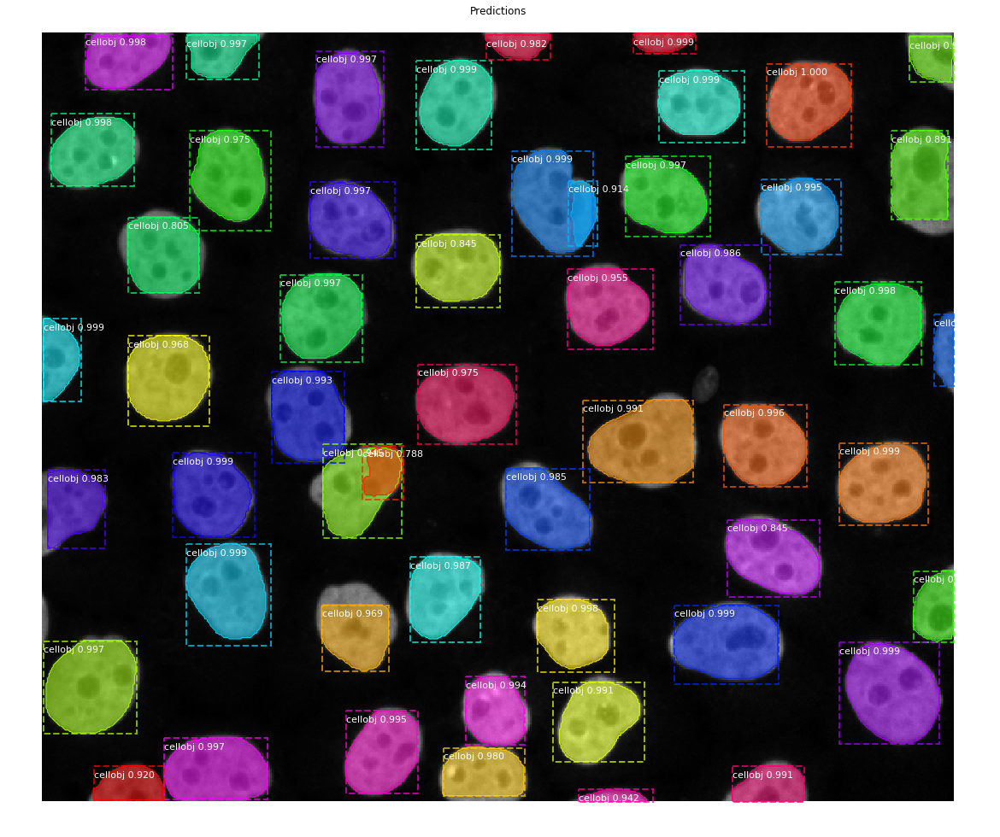

In [18]:
# b4 = image[512:, 512:,:]
b4 = image[539:, 639:, :]

b4results = model.detect([b4], verbose=1)
ax = get_ax(1)
b4r = b4results[0]
visualize.display_instances(b4, b4r['rois'], b4r['masks'], b4r['class_ids'], 
                            fov_dataset.class_names, b4r['scores'], ax=ax,
                            title="Predictions")

(1078, 1278, 54)
(1078, 1278, 47)
(1078, 1278, 45)
(1078, 1278, 53)
(1078, 1278, 199)


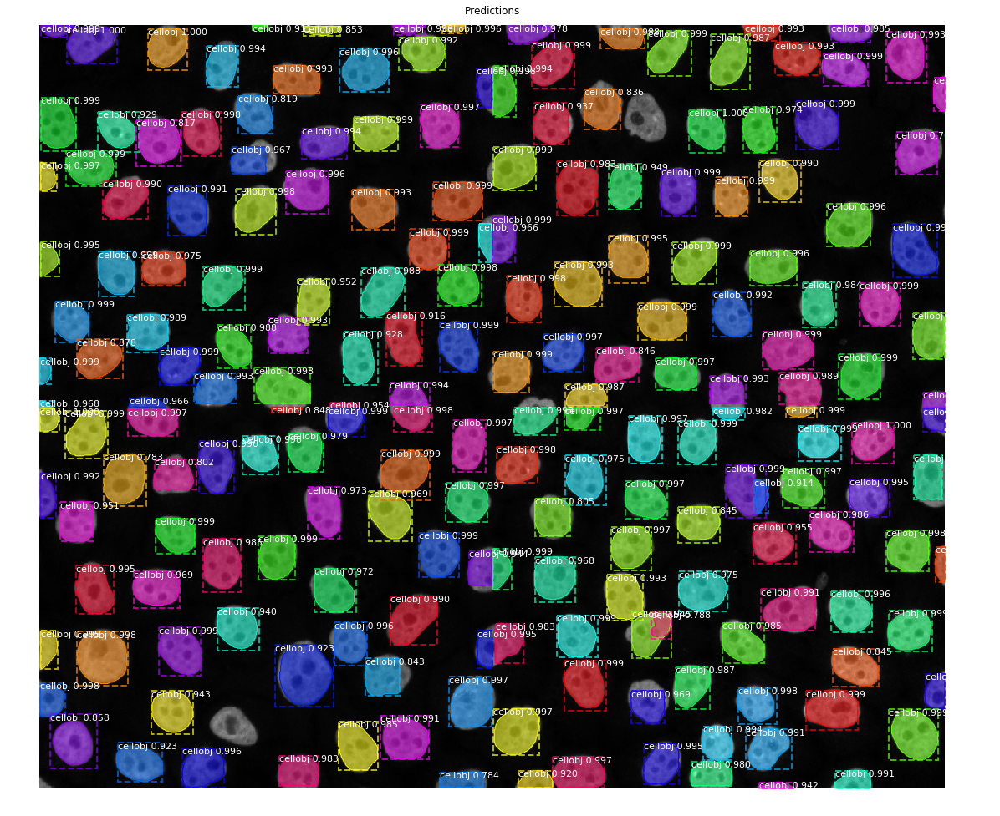

In [19]:
b1roi = b1r['rois']
b2roi = b2r['rois']
b3roi = b3r['rois']
b4roi = b4r['rois']

b12 = np.concatenate((b1, b2), axis=1)
b34 = np.concatenate((b3,b4), axis=1)
b1234 = np.concatenate((b12, b34), axis=0)

for instance in b2roi:
    instance[1] += 639
    instance[3] += 639
for instance in b3roi:
    instance[0] += 539
    instance[2] += 539
for instance in b4roi:
    instance[1] += 639
    instance[3] += 639
    instance[0] += 539
    instance[2] += 539
    
def pad(arrays, reference, offsets):
    """
    array: Array to be padded
    reference: Reference array with the desired shape
    offsets: list of offsets (number of elements must be equal to the dimension of the array)
    """
    # Create an array of zeros with the reference shape
    result = np.full((reference[0],reference[1],reference[2]), False, dtype=bool)
    print(result.shape)
    # Create a list of slices from offset to offset + shape in each dimension
    insertHere = [slice(offsets[dim], offsets[dim] + arrays.shape[dim]) for dim in range(arrays.ndim)]
    #print(insertHere)
    #print(arrays.shape)
    # Insert the array in the result at the specified offsets
    result[insertHere] = arrays
    return result


#print(b1r['masks'].shape[2])
b1masks = pad(b1r['masks'], [1078, 1278, b1r['masks'].shape[2]], [0,0,0])
b2masks = pad(b2r['masks'], [1078, 1278, b2r['masks'].shape[2]], [0,639,0])
b3masks = pad(b3r['masks'], [1078, 1278, b3r['masks'].shape[2]], [539,0,0])
b4masks = pad(b4r['masks'], [1078, 1278, b4r['masks'].shape[2]], [539,639,0])



b12roi = np.concatenate((b1roi, b2roi), axis=0)
b12masks = np.concatenate((b1masks, b2masks), axis=2)
b12ci = np.concatenate((b1r['class_ids'], b2r['class_ids']), axis=0)
b12scores = np.concatenate((b1r['scores'], b2r['scores']), axis=0)

b34roi = np.concatenate((b3roi, b4roi), axis=0)
b34masks = np.concatenate((b3masks, b4masks), axis=2)
b34ci = np.concatenate((b3r['class_ids'], b4r['class_ids']), axis=0)
b34scores = np.concatenate((b3r['scores'], b4r['scores']), axis=0)

b1234roi = np.concatenate((b12roi, b34roi), axis=0)
b1234masks = np.concatenate((b12masks, b34masks), axis=2)
b1234ci = np.concatenate((b12ci, b34ci), axis=0)
b1234scores = np.concatenate((b12scores, b34scores), axis=0)

print(b1234masks.shape)


#print(ax)
ax=get_ax(1)
visualize.display_instances(b1234, b1234roi, b1234masks, b1234ci, 
                            fov_dataset.class_names, b1234scores, ax=ax,
                            title="Predictions")
#print(b12roi)


In [20]:
def mask_stack_to_single_image(image, masks, offset):
    
    # switch shape to [num_masks, h, w] from [h, w, num_masks]
    masks = masks.astype(int) 
    #masks = np.moveaxis(masks, 0, -1)
    masks = np.moveaxis(masks, -1, 0) 
    
    #image_shape = masks.shape
    #image = np.zeros(image_shape[1:])
    #print(image.shape)
    num_masks = masks.shape[0] # shape = [h,w, num_masks]
    
    current_id = 1
    
    for i in range(num_masks):
        current_mask = masks[i]
        image = add_mask_to_ids(image, current_mask, offset, current_id)
        current_id += 1
        
    return image

In [21]:
def add_mask_to_ids(image, mask, offset, fill_int):
    for (row,col), value in np.ndenumerate(mask):
        #print(x,y, value)

        if value != 0 and image[row + offset[0]-1,col + offset[1]-1] == 0:
            image[row + offset[0]-1,col + offset[1]-1] = fill_int
    #image[instance_indices] = fill_int
    
    #instance_indices = np.transpose(np.nonzero(mask))
    #image[instance_indices] = fill_int
    return image
    

In [22]:
def run_inference(model, image):
    
    # get results
    
    results = model.detect([image], verbose=1)

    # Display results
    #ax = get_ax(1)
    r = results[0]
    #visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
    #                            fov_dataset.class_names, r['scores'], ax=ax,
    #                            title="Predictions")
    masks = r['masks']
    print(masks.shape)
    return masks

In [23]:
def generate_inference_model(model_path, cropsize):
    import math
    class InferenceConfig(CellsConfig):
        GPU_COUNT = 1
        IMAGES_PER_GPU = 1
        # comment below if running inference on small crops
        TRAIN_ROIS_PER_IMAGE = 2000
        POST_NMS_ROIS_INFERENCE = 13000
        DETECTION_MAX_INSTANCES = 200
        #DETECTION_NMS_THRESHOLD = 0.35
        IMAGE_MIN_DIM = cropsize #math.ceil(mindim / 256) * 256
        IMAGE_MAX_DIM = cropsize #math.ceil(maxdim / 256) * 256

    inference_config = InferenceConfig()

    # Recreate the model in inference mode
    DEVICE = '/device:GPU:0'
    with tf.device(DEVICE):
        model = modellib.MaskRCNN(mode="inference", 
                              config=inference_config,
                              model_dir=MODEL_DIR)

    # Get path to saved weights
    # Either set a specific path or find last trained weights
    # model_path = os.path.join(ROOT_DIR, ".h5 file name here")

    #model_path = model.find_last()[1]
    #model_path = '/data/kimjb/Mask_RCNN_original/logs/cells20180628T1527/mask_rcnn_cells_0100.h5'

    # Load trained weights (fill in path to trained weights here)
    assert model_path != "", "Provide path to trained weights"
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    
    return model

In [24]:
def stitched_inference(image, cropsize, model_path, padding=40):#, minsize=100):
    final_image = np.zeros(image.shape[0:2]) # make new image of zeros (exclude third dimension, not using rgb)
    visited = set()
    #rowcrop = cropsize[0] # row size of cropped image to run inference on
    #colcrop = cropsize[1] # col ||
    
    num_row = image.shape[0] # num rows in the image
    num_col = image.shape[1]
    print(image.shape)
    
    row = 0
    col = 0
    
    model = generate_inference_model(model_path, cropsize)
    
    for row in np.arange(0, num_row, cropsize-padding): # row defines the rightbound side of box
        for col in np.arange(0, num_col, cropsize-padding): # col defines lowerbound of box
            upperbound = row
            lowerbound = row + cropsize
            leftbound  = col
            rightbound = col + cropsize
            
            if lowerbound > num_row:
                lowerbound = num_row
                upperbound = num_row-cropsize
            
            if rightbound > num_col:
                rightbound = num_col
                leftbound  = num_col-cropsize
            #upperbound = bound(final_image, cropsize, padding, minsize, row, 'upper')
            #lowerbound = bound(final_image, cropsize, padding, minsize, row, 'lower')
            #rightbound = bound(final_image, cropsize, padding, minsize, col, 'right')
            #leftbound  = bound(final_image, cropsize, padding, minsize, col, 'left')
            #print(row)
            #print(col)
            print('bounds:')
            print('upper: {}'.format(upperbound))
            print('lower: {}'.format(lowerbound))
            print('left : {}'.format(leftbound))
            print('right: {}'.format(rightbound))
            
            cropped_image = image[upperbound:lowerbound, leftbound:rightbound, :]
            print('cropped image shape: {}'.format(cropped_image.shape))
            print(cropped_image.shape)
            
            masks = run_inference(model, cropped_image)
            
            #padded_masks = pad(masks, [num_row, num_col, masks.shape[2]], [upperbound,leftbound,0])
            #print('mask shape:')
            #print (padded_masks.shape)
            
            final_image = mask_stack_to_single_image(final_image, masks, [upperbound, leftbound])
            
    return final_image

In [25]:
def pad(arrays, reference, offsets):
    """
    array: Array to be padded
    reference: Reference array with the desired shape
    offsets: list of offsets (number of elements must be equal to the dimension of the array)
    """
    # Create an array of zeros with the reference shape
    result = np.full((reference[0],reference[1],reference[2]), False, dtype=bool)
    print('result:')
    print(result.shape)
    # Create a list of slices from offset to offset + shape in each dimension
    insertHere = [slice(offsets[dim], offsets[dim] + arrays.shape[dim]) for dim in range(arrays.ndim)]
    #print(insertHere)
    #print(arrays.shape)
    # Insert the array in the result at the specified offsets
    result[insertHere] = arrays
    return result

In [26]:
cal_dir = '/data/kimjb/Mask_RCNN/images/to_caltech/exp3'

cal_datadset = CellsDataset()
cal_dataset.load_cells(cal_dir, subset='fov')
cal_dataset.prepare()

NameError: name 'cal_dataset' is not defined

In [ ]:
cal_id = random.choice(cal_dataset.image_ids)
cal_image = fov_dataset.load_image(cal_id)
cal_stitched = stitched_inference(cal_image, 512, model_path, padding=150)

In [27]:
import time
image_id_stitched = random.choice(fov_dataset.image_ids)
image_stitched = fov_dataset.load_image(image_id)

start = time.time()
FI = stitched_inference(image_stitched, 512, model_path, padding=25)
end = time.time()
print (end-start)

(1078, 1278, 3)
Loading weights from  /data/kimjb/Mask_RCNN/logs/cells20180719T1559/mask_rcnn_cells.h5
bounds:
upper: 0
lower: 512
left : 0
right: 512
cropped image shape: (512, 512, 3)
(512, 512, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  228.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  124.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
(512, 512, 34)
bounds:
upper: 0
lower: 512
left : 487
right: 999
cropped image shape: (512, 512, 3)
(512, 512, 3)
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  202.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   98.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 

In [36]:
from scipy.misc import imsave
imsave('/data/kimjb/Mask_RCNN/stitched.tif', FI)

In [37]:
imsave('/data/kimjb/Mask_RCNN/original.tif', image_stitched)

In [109]:
# model trained w 200 epochs and trained heads and all layers
model_path = '/data/kimjb/Mask_RCNN/logs/cells20180719T1559/mask_rcnn_cells.h5'

In [28]:
sys.setrecursionlimit(50000)

class CleanMask():
    def __init__(self, image):
        self.image = image
        self.num_row = self.image.shape[0]
        self.num_col = self.image.shape[1]
        self.masks = np.zeros((self.num_row, self.num_col))
        self.visitedPoints = set()
        self.id = 0
        
    def inBounds(self, row, col):
        if (row < 0 or row >= self.num_row):
            return False
        if (col < 0 or col >= self.num_col):
            return False
        return True
    
    def getMasks(self):
        return self.masks
    
    def visited(self, row, col):
        if (row,col) in self.visitedPoints:
            return True
    
    def dfs(self, row, col):
        if not self.visited(row,col):
            if self.image[row,col] > 0:
                self.masks[row,col] = self.id
                #print('[{},{}]'.format(row, col))
            self.visitedPoints.add((row,col))

            if self.inBounds(row+1, col):
                if self.image[row+1, col] > 0:
                    self.dfs(row+1, col)
                    
            if self.inBounds(row, col+1):
                if self.image[row, col+1] > 0:
                    self.dfs(row, col+1)
                    
            if self.inBounds(row, col-1):
                if self.image[row, col-1] > 0:
                    self.dfs(row, col-1)
            
            if self.inBounds(row-1, col):
                if self.image[row-1, col] > 0:
                    self.dfs(row-1, col)
            
    def cleanup(self):
        for (row,col), value in np.ndenumerate(self.image):
            if value > 0 and not self.visited(row,col):
                self.id += 1
                self.dfs(row, col)


In [29]:
mask2 = CleanMask(FI)
        
        

In [30]:
mask2.cleanup()

In [38]:
imsave('/data/kimjb/Mask_RCNN/clean_mask.tif', mask2.getMasks())

In [40]:
from data import generate_masks
mask = mask2.getMasks()
mask_dict = generate_masks(mask)



In [43]:
print (mask_dict[1].shape)

(1078, 1278)


In [47]:
def mask_dict_to_mask_array(mask_dict):
    mask_stack = np.full((np.mask_dict[1].shape),False, dtype=bool)
    for key in mask_dict:
        mask_stack = np.concatenate((mask_stack, mask_dict[key]), axis=2)
    return mask_stackx    
        
        
visualize.display_instances(FI, [1], b4r['masks'], [1], 
                            fov_dataset.class_names,[1], ax=ax,
                            title="Predictions")

AttributeError: 'list' object has no attribute 'shape'

In [46]:
print(type(model.keras_model))
# serialize model to JSON
model_json = model.keras_model.to_json()
with open("/scratch/kimjb/to-zakigf/model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
#model.save_weights("model.h5")
print("Saved model to disk")

<class 'keras.engine.training.Model'>


FileNotFoundError: [Errno 2] No such file or directory: '/scratch/kimjb/to-zakigf/model.json'

In [ ]:
model.find_last()[1]
model.find_last()[0]

In [39]:
def generate_inference_model(model_path, cropsize):
    import math
    class InferenceConfig(CellsConfig):
        GPU_COUNT = 1
        IMAGES_PER_GPU = 1
        # comment below if running inference on small crops
        TRAIN_ROIS_PER_IMAGE = 2000
        POST_NMS_ROIS_INFERENCE = 13000
        DETECTION_MAX_INSTANCES = 200
        #DETECTION_NMS_THRESHOLD = 0.35
        IMAGE_MIN_DIM = cropsize #math.ceil(mindim / 256) * 256
        IMAGE_MAX_DIM = cropsize #math.ceil(maxdim / 256) * 256

    inference_config = InferenceConfig()

    # Recreate the model in inference mode
    DEVICE = '/device:GPU:0'
    with tf.device(DEVICE):
        model = modellib.MaskRCNN(mode="inference", 
                              config=inference_config,
                              model_dir=MODEL_DIR)

    # Get path to saved weights
    # Either set a specific path or find last trained weights
    # model_path = os.path.join(ROOT_DIR, ".h5 file name here")

    #model_path = model.find_last()[1]
    #model_path = '/data/kimjb/Mask_RCNN_original/logs/cells20180628T1527/mask_rcnn_cells_0100.h5'

    # Load trained weights (fill in path to trained weights here)
    assert model_path != "", "Provide path to trained weights"
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    
    return model

In [40]:
def run_inference(model, image):
    # get results
    results = model.detect([image], verbose=1)

    # Display results
    #ax = get_ax(1)
    r = results[0]
    #visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
    #                            fov_dataset.class_names, r['scores'], ax=ax,
    #                            title="Predictions")
    masks = r['masks']
    print(masks.shape)
    return masks

In [41]:
def mask_stack_to_single_image(masks):
    image = np.zeros((masks.shape[0:2])) # image that contains all cells (0 bg, >0 is cell id)
    
    # switch shape to [num_masks, h, w] from [h, w, num_masks]
    masks = masks.astype(int) 
    #masks = np.moveaxis(masks, 0, -1)
    masks = np.moveaxis(masks, -1, 0) 
    
    #image_shape = masks.shape
    #image = np.zeros(image_shape[1:])
    #print(image.shape)
    num_masks = masks.shape[0] # shape = [n, h, w]
    
    current_id = 1
    
    for i in range(num_masks):
        current_mask = masks[i]
        image = add_mask_to_ids(image, current_mask, current_id)
        current_id += 1
        
    return image

In [42]:
def add_mask_to_ids(image, mask, fill_int):
    for (row,col), value in np.ndenumerate(mask):
        if value != 0 and image[row,col] == 0:
            image[row, col] = fill_int    
    return image
    

In [ ]:
def pad(arrays, reference, offsets):
    """
    array: Array to be padded
    reference: Reference array with the desired shape
    offsets: list of offsets (number of elements must be equal to the dimension of the array)
    """
    # Create an array of zeros with the reference shape
    result = np.full((reference[0],reference[1]), False, dtype=bool)
    print('result:')
    print(result.shape)
    # Create a list of slices from offset to offset + shape in each dimension
    insertHere = [slice(offsets[dim], offsets[dim] + arrays.shape[dim]) for dim in range(arrays.ndim)]
    #print(insertHere)
    #print(arrays.shape)
    # Insert the array in the result at the specified offsets
    result[insertHere] = arrays
    return result

In [43]:
def stitched_inference(image, cropsize, model, padding=40):#, minsize=100):
    stack = np.zeros((image.shape[0], image.shape[1],1)) # make new image of zeros (exclude third dimension, not using rgb)
    visited = np.zeros(image.shape[0:2])
    num_times_visited = np.zeros(image.shape[0:2])
    
    num_row = image.shape[0] # num rows in the image
    num_col = image.shape[1]
    print(image.shape)
    
    assert cropsize < num_row and cropsize < num_col, 'cropsize must be smaller than the image dimensions'
    
    #model = generate_inference_model(model_path, cropsize)
    
    rowlist = np.concatenate(([0],np.arange(cropsize-padding, num_row, cropsize)))
    collist = np.concatenate(([0],np.arange(cropsize-padding, num_col, cropsize)))
    
    for row in rowlist: # row defines the rightbound side of box
        for col in collist: # col defines lowerbound of box
            masks_with_ids = np.zeros(image.shape[0:2])
            upperbound = row
            lowerbound = row + cropsize
            leftbound  = col
            rightbound = col + cropsize
            
            if lowerbound > num_row:
                lowerbound = num_row
                upperbound = num_row-cropsize
            
            if rightbound > num_col:
                rightbound = num_col
                leftbound  = num_col-cropsize
            #upperbound = bound(final_image, cropsize, padding, minsize, row, 'upper')
            #lowerbound = bound(final_image, cropsize, padding, minsize, row, 'lower')
            #rightbound = bound(final_image, cropsize, padding, minsize, col, 'right')
            #leftbound  = bound(final_image, cropsize, padding, minsize, col, 'left')
            #print(row)
            #print(col)
            print('bounds:')
            print('upper: {}'.format(upperbound))
            print('lower: {}'.format(lowerbound))
            print('left : {}'.format(leftbound))
            print('right: {}'.format(rightbound))
            
            num_times_visited[upperbound:lowerbound, leftbound:rightbound] += 1
            cropped_image = image[upperbound:lowerbound, leftbound:rightbound, :]
            #print('cropped image shape: {}'.format(cropped_image.shape))
            #print(cropped_image.shape)
             
            masks = run_inference(model, cropped_image)
            
            #padded_masks = pad(masks, [num_row, num_col, masks.shape[2]], [upperbound, leftbound])
            #padded_masks = pad(masks, [num_row, num_col, masks.shape[2]], [upperbound,leftbound,0])
            #print('mask shape:')
            #print (padded_masks.shape)
            
            one_inference_mask_image = mask_stack_to_single_image(masks)
            padded_inference_mask = pad(one_inference_mask_image, [num_row, num_col], [upperbound,leftbound])
            padded_inference_mask = np.expand_dims(padded_inference_mask, axis=2)
            print(padded_inference_mask.shape)
            stack = np.concatenate((stack, padded_inference_mask), axis=2)
            
            
    return stack, num_times_visited




In [45]:
model = generate_inference_model(model_path, 512)

Loading weights from  /data/kimjb/Mask_RCNN/logs/cells20180719T1559/mask_rcnn_cells.h5


In [47]:
import time
image_id_stitched = random.choice(fov_dataset.image_ids)
image_stitched = fov_dataset.load_image(image_id)

start = time.time()
stitched_inference_stack, num_times_visited = stitched_inference(image_stitched, 512, model, padding=25)
end = time.time()
print (end-start)

(1078, 1278, 3)
bounds:
upper: 0
lower: 512
left : 0
right: 512
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  228.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  124.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
(512, 512, 34)
result:
(1078, 1278)
(1078, 1278, 1)
bounds:
upper: 0
lower: 512
left : 487
right: 999
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  202.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   98.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
(512, 512, 36)
result:
(1078, 1278

In [77]:
def save_numpy_nd_array(array_name, file_name):
    if array_name.ndim == 2:
        array_name = array_name[newaxis,:]
    assert array_name.ndim == 3
    imlist = []
    for frame in array_name:
        imlist.append(Image.fromarray(frame))
    imlist[0].save(file_name, save_all=True, append_images=imlist[1:])

In [79]:
test = np.moveaxis(stitched_inference_stack, -1, 0) 

save_numpy_nd_array(test, 'entire_stack_3d.tif')

In [76]:
print (stitched_inference_stack[0:2])
print(num_times_visited[500,5])

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
2.0


In [72]:
sys.setrecursionlimit(50000)

class CleanMask2():
    def __init__(self, stack, num_times_visited):
        ## input 
        self.stack = stack #stack of masks
        self.num_times_visited = num_times_visited #how many times inference ran on each pixel
        
        self.num_row = self.stack.shape[0]
        self.num_col = self.stack.shape[1]
        self.masks = np.zeros((self.num_row, self.num_col))
        self.visitedPoints = np.zeros((self.num_row, self.num_col))
        self.id = 0
        
    def inBounds(self, row, col):
        if (row < 0 or row >= self.num_row):
            return False
        if (col < 0 or col >= self.num_col):
            return False
        return True
    
    def getMasks(self):
        return self.masks
    
    def visited(self, row, col):
        if self.visitedPoints[row,col] == 1:
            return True
    
    def get_ids(self, array):
        ids = []
        for value in array:
            if value > 0:
                ids.append(value)
        return ids
    
    
    def dfs_specific(self, row, col, value):
        if not self.visited(row,col):
            if value in self.get_ids(self.stack[row,col,:]):
                self.masks[row,col] = self.id
                #print('[{},{}]'.format(row, col))
            self.visitedPoints[row,col] = 1

            if self.inBounds(row+1, col):
                if value in self.get_ids(self.stack[row+1,col,:]):
                    self.dfs_specific(row+1, col, value)
                    
            if self.inBounds(row, col+1):
                if value in self.get_ids(self.stack[row,col+1,:]):
                    self.dfs_specific(row, col+1, value)
                    
            if self.inBounds(row, col-1):
                if value in self.get_ids(self.stack[row,col-1,:]):
                    self.dfs_specific(row, col-1, value)
            
            if self.inBounds(row-1, col):
                if value in self.get_ids(self.stack[row-1,col,:]):
                    self.dfs_specific(row-1, col, value)
    
    
    def dfs_normal(self, row, col):
        if not self.visited(row,col):
            ids = self.get_ids(self.stack[row,col,:])
            if len(ids) > 0:
                self.masks[row,col] = self.id
            self.visitedPoints[row,col] = 1
        
            if self.inBounds(row+1, col):
                if len(self.get_ids(self.stack[row+1,col,:])) > 0 :
                    self.dfs_normal(row+1, col)
                    
            if self.inBounds(row, col+1):
                if len(self.get_ids(self.stack[row,col+1,:])) > 0:
                    self.dfs_normal(row, col+1)
                    
            if self.inBounds(row, col-1):
                if len(self.get_ids(self.stack[row,col-1,:])) > 0:
                    self.dfs_normal(row, col-1)
            
            if self.inBounds(row-1, col):
                if len(self.get_ids(self.stack[row-1,col,:])) > 0:
                    self.dfs_normal(row-1, col)
    
    
    def cleanup(self):
        # algorithm:
        # go through every pixel. If you have not 'visited' this pixel, then check to see if this is a unique inference
        # pixel, meaning make sure this pixel only had inference run on it once (not an intersection point). 
        
        # If this pixel has unique inference, then check to see if it was only assigned a cell value (not bg). 
        # If not, add the pixel to visited. Else, do dfs on that pixel and assign all touching pixels that have also 
        # been assigned the pixel value to a new value.
        
        # For the remaining pixels that have not been visited yet (the intersection points minus the cells that have
        # shared cell ids), do regular dfs on them
        for row in range(self.num_row):
            for col in range(self.num_col):
                if not self.visited(row,col) and self.num_times_visited[row,col] == 1:
                    all_pixel_values = self.stack[row,col,:] # get every value the model predicted for a single pixel in every inference result
                    ids = self.get_ids(all_pixel_values)
                    if len(ids) == 0:
                        self.visitedPoints[row,col] = 1
                        self.masks[row,col] = 0
                        
                    if len(ids) == 1:
                        self.id += 1
                        self.dfs_specific(row,col, ids[0])
                        
        for row in range(self.num_row):
            for col in range(self.num_col):
                if not self.visited(row,col):
                    self.id += 1
                    self.dfs_normal(row,col)




In [73]:
newalgmask = CleanMask2(stitched_inference_stack, num_times_visited)

In [74]:
newalgmask.cleanup()

In [75]:
imsave('/data/kimjb/Mask_RCNN/newalgtest.tif', newalgmask.getMasks())


In [80]:
imsave('/data/kimjb/Mask_RCNN/visited.tif', num_times_visited)

In [110]:
a = np.arange(24).reshape((2,3,4))

In [117]:
a[1,1,:]


array([16, 17, 18, 19])